# Functional analysis of gene signatures

In this session we will analyze the differentially expressed genes found by DESeq2 on the bulk RNA-seq data, for the p53 case study. Two replicates of non-stimulated (NS) RNA-seq samples were compared with 2 replicates of stimulated (S) RNA-seq samples. 

The DESeq2 analysis resulted in a deseq.results.tsv file, which we will use here.
The Seurat analysis of scRNA-seq data ...
The Scanpy analysis of scRNA-seq data ...

In [1]:
mkdir -p /mnt/storage/$USER/jupyternotebooks/functional_analysis_gene_signatures/
cd /mnt/storage/$USER/jupyternotebooks/functional_analysis_gene_signatures/

In [2]:
ln -sf /mnt/storage/data/RNA-seq/GSE47042/deseq.results.tsv .

In [2]:
head deseq.results.tsv

	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
PLK1	2169.89887036599	-4.66219867916598	0.133635353659893	-34.8874646677065	1.15177059571362e-266	1.68388861093331e-262
CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
CDC20	2087.37990872435	-4.40177745450003	0.130177472157127	-33.8136651569558	1.24205653171511e-250	6.05295549789164e-247
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
CCNA2	1833.68494342593	-4.58742887189172	0.141728770920042	-32.3676614290247	7.82962634244032e-230	2.28938274252955e-226
KIF20A	2304.20076082827	-4.59980047267874	0.142632224344441	-32.2493776831997	3.58935101133231e-228	8.74605196427972e-225
HMGB2	2441.5235956432	-3.64481763157341	0.121698431532697	-29.9495859204572	4.4548629638111e-197	9.3042995044169e-194
PRC1	3467.82739378419	-3.21578273306019	0.107728899485699	-29.8506969662961	8.59778727441137e-196	1.5712456243

You can edit your own deseq.results.tsv file to add Gene in the first column as header. You can do this on the server using emacs, or in the Jupyter text editor, or locally in your Notepad++ or TextWrangler on your PC.
Here is my edited version:


In [3]:
head deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
PLK1	2169.89887036599	-4.66219867916598	0.133635353659893	-34.8874646677065	1.15177059571362e-266	1.68388861093331e-262
CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
CDC20	2087.37990872435	-4.40177745450003	0.130177472157127	-33.8136651569558	1.24205653171511e-250	6.05295549789164e-247
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
CCNA2	1833.68494342593	-4.58742887189172	0.141728770920042	-32.3676614290247	7.82962634244032e-230	2.28938274252955e-226
KIF20A	2304.20076082827	-4.59980047267874	0.142632224344441	-32.2493776831997	3.58935101133231e-228	8.74605196427972e-225
HMGB2	2441.5235956432	-3.64481763157341	0.121698431532697	-29.9495859204572	4.4548629638111e-197	9.3042995044169e-194
PRC1	3467.82739378419	-3.21578273306019	0.107728899485699	-29.8506969662961	8.59778727441137e-196	1.571245

In [4]:
head -1 deseq.results.tsv
grep -n CDKN1A deseq.results.tsv
grep -n BBC3 deseq.results.tsv
grep -n GDF15 deseq.results.tsv

Gene	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
3:CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
318:BBC3	562.315816976695	2.59896850942885	0.203037787035362	12.800417830481	1.63071451651212e-37	7.52083477331457e-36
807:GDF15	4870.22167706625	3.50955917836896	0.438638362663797	8.00103109325832	1.23381624418365e-15	2.23801408064082e-14


Some of the known targets are strongly up-regulated (logFC > 2) and p.adj << 0.05

## Use arbitrary thresholds to create lists of up- and down-regulated genes
* careful: there are a lot of genes without detected expression, they have NA in the logFC column; so column 3 ($3) should not be "NA" 
* we're using awk to filter this file, selecting only rows where the logFC (column 3, indicated by "\$3") is higher than a threshold; and the padj is lower than a threshold
* print ; => prints all the columns of the rows that fulfill our requirements

In [5]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print ;}' deseq.results.tsv | head

CDKN1A	25241.2080295721	4.42457936561409	0.129633158756298	34.1315401712306	2.5125839341367e-255	1.83669885585392e-251
TP53INP1	3332.81998084826	4.14308467439012	0.12651543848487	32.7476608705394	3.27820954642684e-235	1.19818558921901e-231
GSN	4654.36031377549	2.84375790747007	0.100124090877586	28.4023343687277	1.89224539154439e-177	2.12804827879839e-174
MDM2	14556.1579849036	3.13530977553073	0.119891653784316	26.1511929860531	9.55207735571581e-151	5.17227299779871e-148
ZMAT3	1819.85668885616	3.20307576176814	0.124453073313054	25.7372170610121	4.48177478939967e-146	1.98556204306131e-143
BTG2	3303.96552826099	2.85934838569789	0.117911084549053	24.2500388884843	6.60591952153278e-130	2.05486262563424e-127
RPS27L	3316.07460633878	2.32025039050914	0.104692094090213	22.1626132390646	7.88402501962729e-109	1.74643099677198e-106
SPATA18	1097.686294007	3.27969760404407	0.150611617656834	21.7758606876981	3.93019544013092e-105	8.32745758474117e-103
ABAT	10853.4905054949	1.85190351601295	0.08957049

Now print only the first column with the gene names

In [6]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv | head

CDKN1A
TP53INP1
GSN
MDM2
ZMAT3
BTG2
RPS27L
SPATA18
ABAT
LINC00086


Write that to a file

In [7]:
awk '$3 != "NA" && $3 > 1 && $7 < 0.05 {print $1}' deseq.results.tsv > up-logFC1-p05.txt

Do the same for significantly down-regulated genes

In [8]:
awk '$3 != "NA" && $3 < -1 && $7 < 0.05 {print $1}' deseq.results.tsv > down-logFC1-p05.txt

In [9]:
wc -l up-logFC1-p05.txt
wc -l down-logFC1-p05.txt

870 up-logFC1-p05.txt
831 down-logFC1-p05.txt


## Humanmine.org

Create a new list on humanmine.org, then click "Save List of N genes"
* For mouse genes, use mousemine.org
* For Drosophila genes, use flymine.org
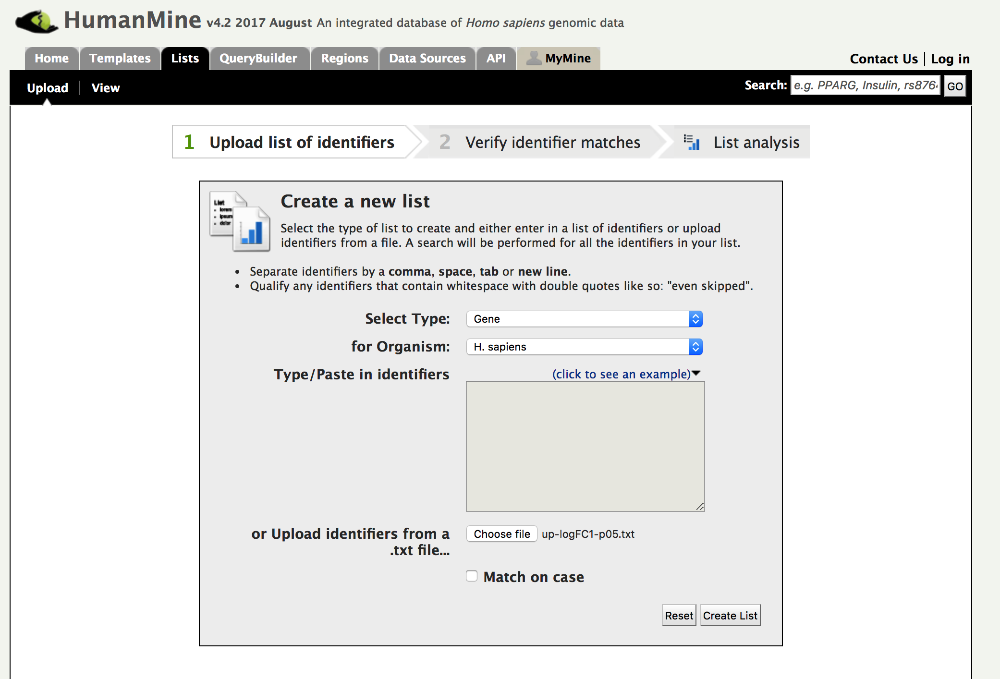

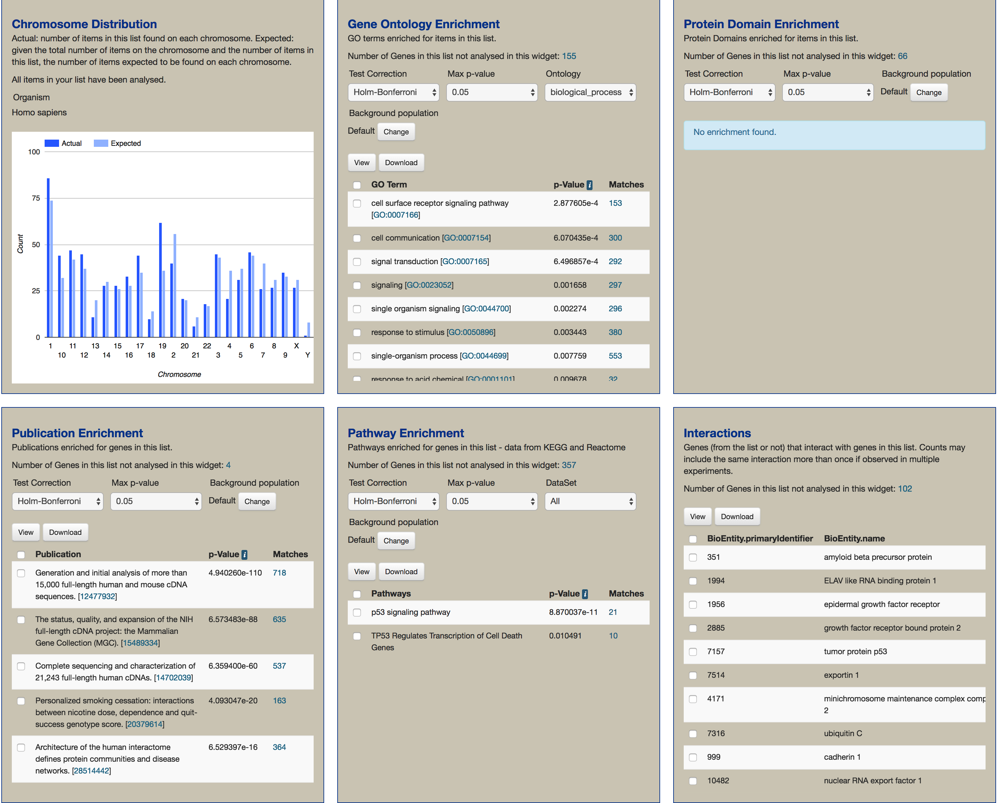

* Pathway enrichment shows that the p53 signaling pathway is enriched, good ! This means among the up-regulated genes are a significant number of genes that are known to be involved in the p53 pathway.
* From the other widgets, like GO, we don't really learn much, for the up-regulated genes.

## Use the entire ranking to determine the "leading edge"

### GORilla

Sort all genes descending by their logFC or padj; here we use logFC

In [10]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene | head

SERPINB5
INPP5D
GPR87
LINC00086
COL17A1
ADAMTS7
CDKN1A
ACTA2
CLCA2
TP53INP1
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [11]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCdesc.txt

Go to http://cbl-gorilla.cs.technion.ac.il/ and enter the text file with ranked gene names, then click on search for enriched GO terms:

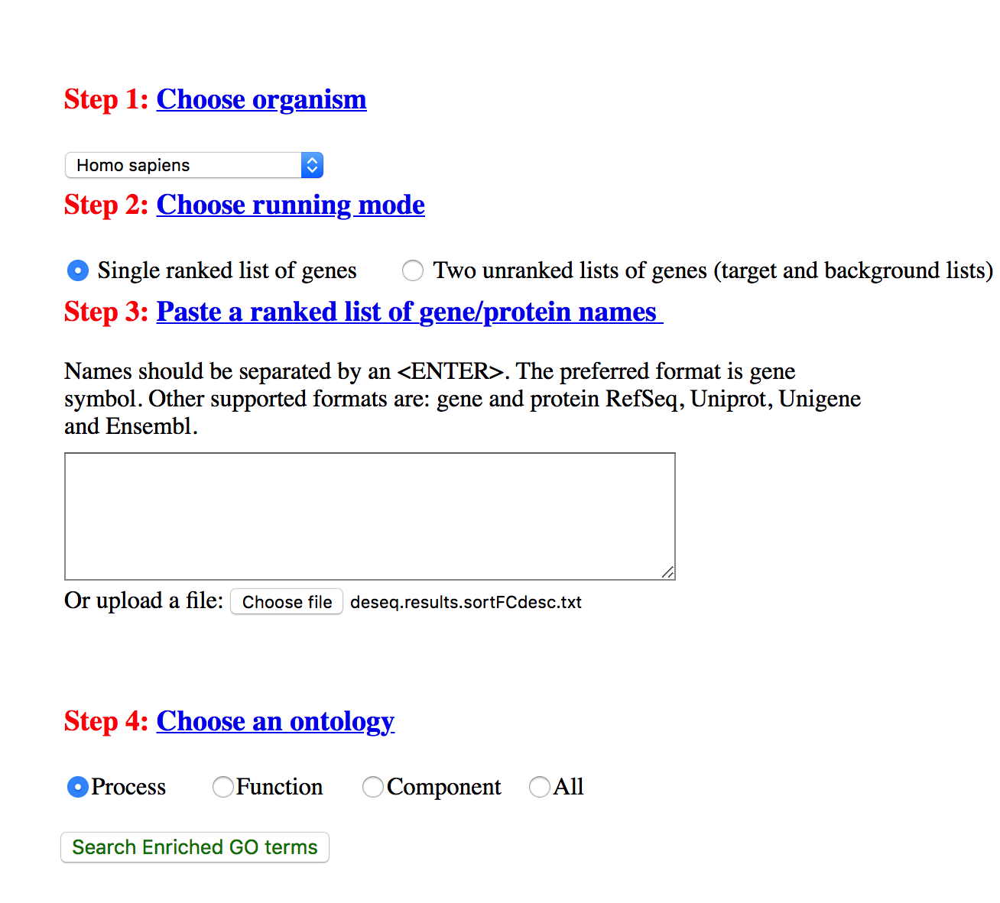

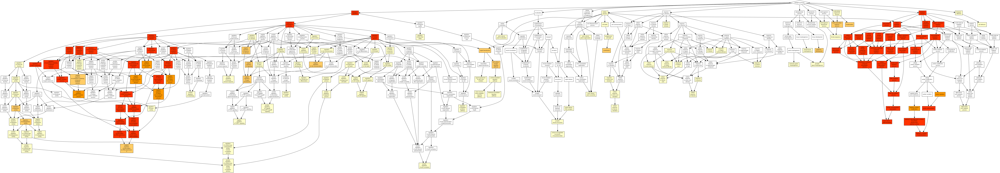

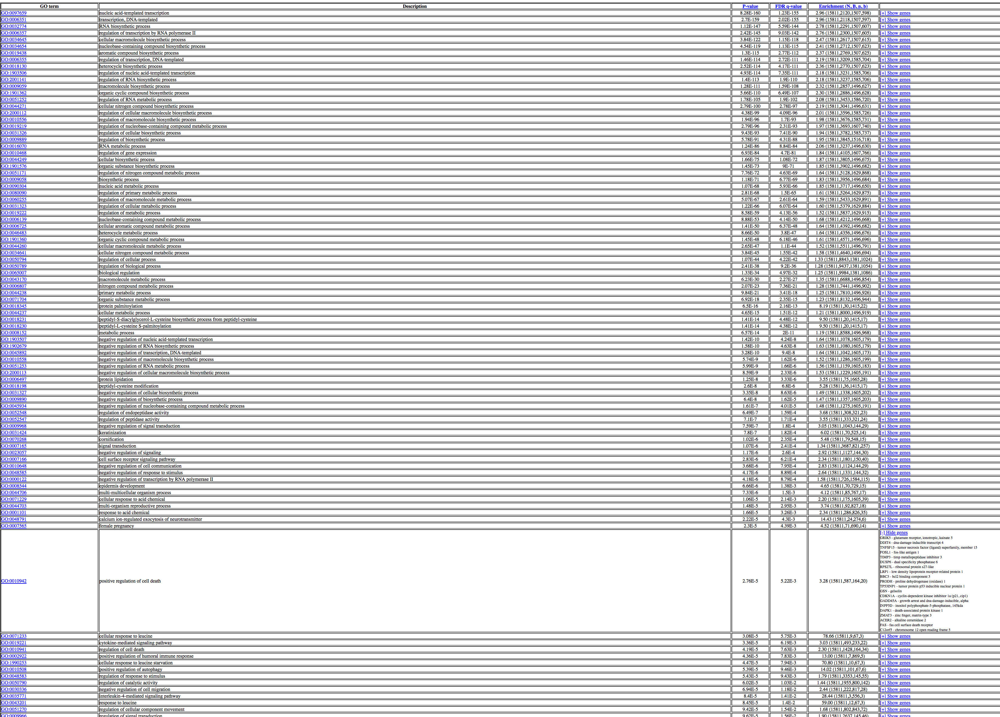

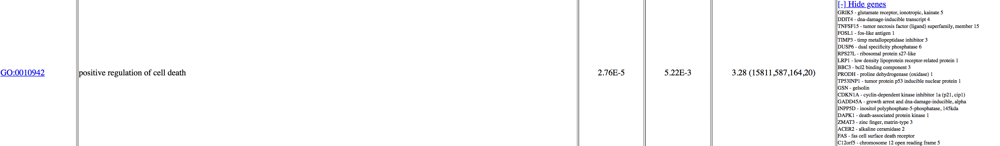

* (15811,587,164,20) => there are 20 genes that are known to be involved in 'positive regulation of cell death'(they are annotated with this GO term or with its child terms), within the top 164 genes; while among all annotated 15811 genes in the human genome, there are 587 genes with this function. The expected frequency is 587/15811 while the observed frequency is 20/164. The latter is significantly higher according to the binomial/hypergeometric distribution, since the adjusted p-value is 0,00522 which is smaller than 0.05.

* The interesting thing about this ranking-based approach, is that the signifance is tested at each threshold. For this particular process, the enrichment is highest at position 164.

* This is called the leading edge.

* If we are interested in how p53 regulates apoptosis, we can choose to use 164 as cutoff, which is more stringent than the arbitrary cutoff applied above.

* However, if we are interested in up-regulation of various metabolic genes, then a cutoff of 1507 genes may be more suited (first enriched term).


Do the same, but now for a ranked list in ascending order (most down-regulated gene on top):

In [12]:
cat deseq.results.tsv | sort -k3,3g | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCasc.txt

In [13]:
head deseq.results.sortFCasc.txt 

NEIL3
PIF1
NDC80
PLK1
KIF20A
CCNA2
KIF14
HMMR
ESPL1
CDC20


In [14]:
grep -n E2F1 deseq.results.sortFCasc.txt 
grep -n E2F1 deseq.results.sortFCdesc.txt

84:E2F1
23648:E2F1


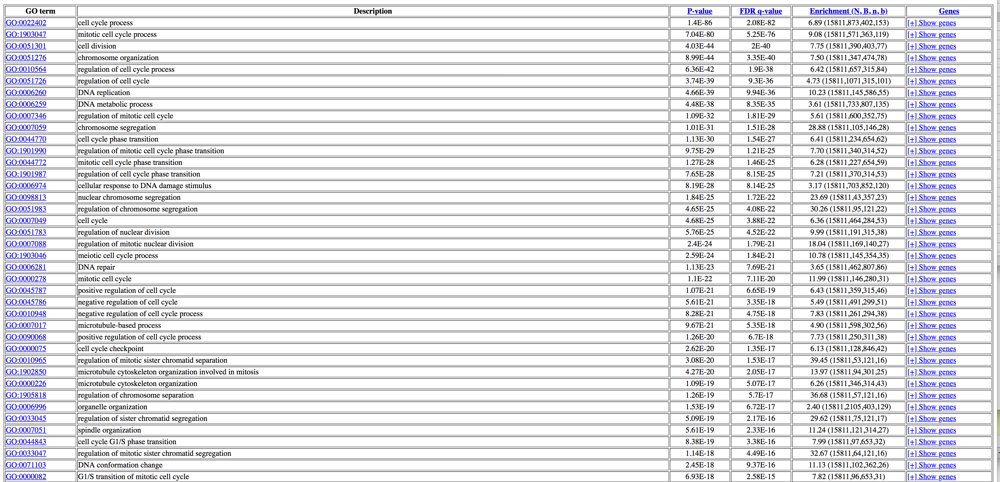

Here we have super-high significance. We also see that cell-cycle related processes lead to a leading edge of around 300-400 genes (so smaller, more stringent, than our arbitrary cutoff above).

### GSEA : Gene Set Enrichment Analysis

GSEA is often used for a ranking-based enrichment analysis. We will use a standalone version of GSEA, which you can download here: http://software.broadinstitute.org/gsea/index.jsp (click on Downloads; but you need to register first).

* GSEA firstly needs file with the ranked genes, as a .rnk file (just a text file with .rnk extension) with 2 columns: the gene name and the logFC value (the value can also be another type of score, here we use the logFC value).
* GSEA also needs a collection of gene lists, such as gene lists representing GO categories, pathways, etc. For human analyses, lots of collections are available from MSigDB. 
* You can also use your own collection of gene sets, then they need to be formatted in a .gmt file format, see https://software.broadinstitute.org/cancer/software/gsea/wiki/index.php/Data_formats
* In the GSEA software, we will use the GSEAPreranked function to test gene signatures against are preranked gene list (the .rnk file).
* An advantage of GSEA is that both the top of the ranking and the bottom will be tested (while GORilla only tests the top of the ranking; for the bottom we had to reverse the ranking)
* It is VERY important to use a ranking of ALL genes that were measured, not of a gene signature !



Let's first generate a .rnk file

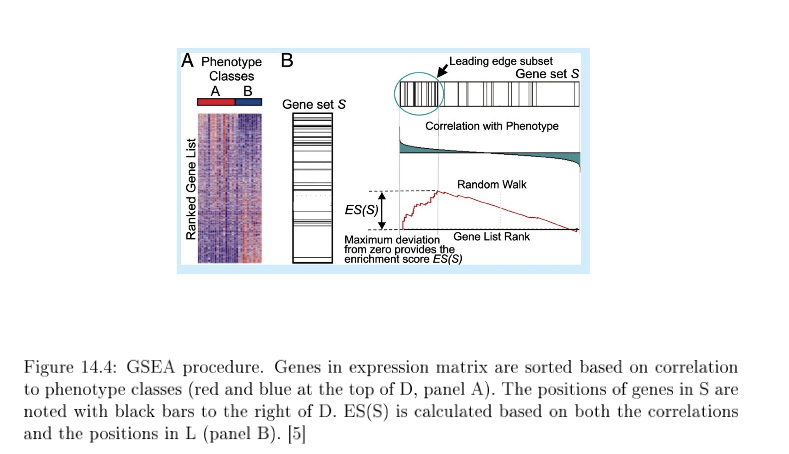

In [15]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | head

SERPINB5 5.14590526609328
INPP5D 4.63097998743725
GPR87 4.54564186346894
LINC00086 4.52193703161954
COL17A1 4.50383513965659
ADAMTS7 4.46146590682569
CDKN1A 4.42457936561409
ACTA2 4.42039228659082
CLCA2 4.23149746554114
TP53INP1 4.14308467439012
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [16]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1, $3}' | grep -v Gene | tr ' ' '\t' > deseq.logFC.rnk

In [20]:
head deseq.logFC.rnk

SERPINB5	5.14590526609328
INPP5D	4.63097998743725
GPR87	4.54564186346894
LINC00086	4.52193703161954
COL17A1	4.50383513965659
ADAMTS7	4.46146590682569
CDKN1A	4.42457936561409
ACTA2	4.42039228659082
CLCA2	4.23149746554114
TP53INP1	4.14308467439012


In the gene set database, we have chosen KEGG pathways.

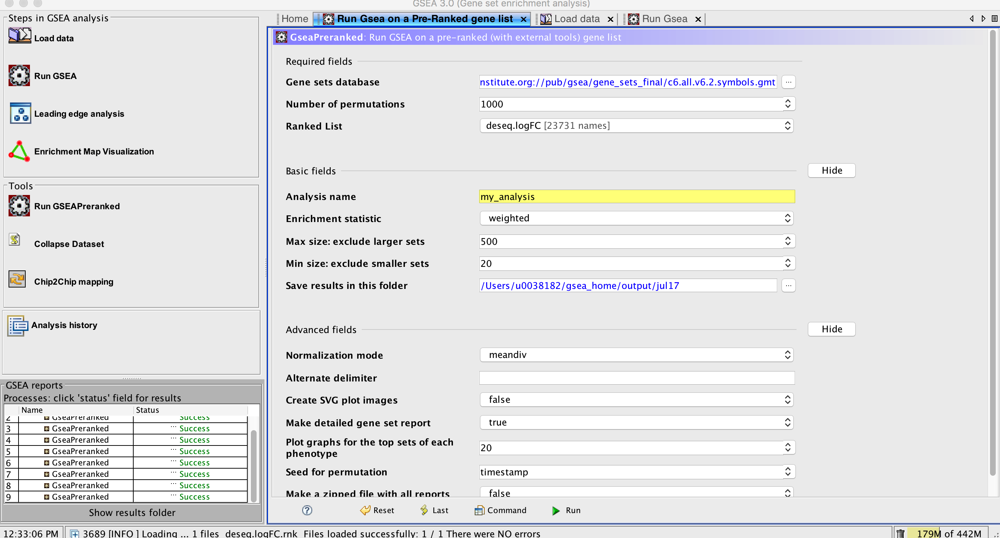

This can take a while. When it's done, click on the "Success". This will open the results in a browser.

Click on the links "enrichment results in HTML""




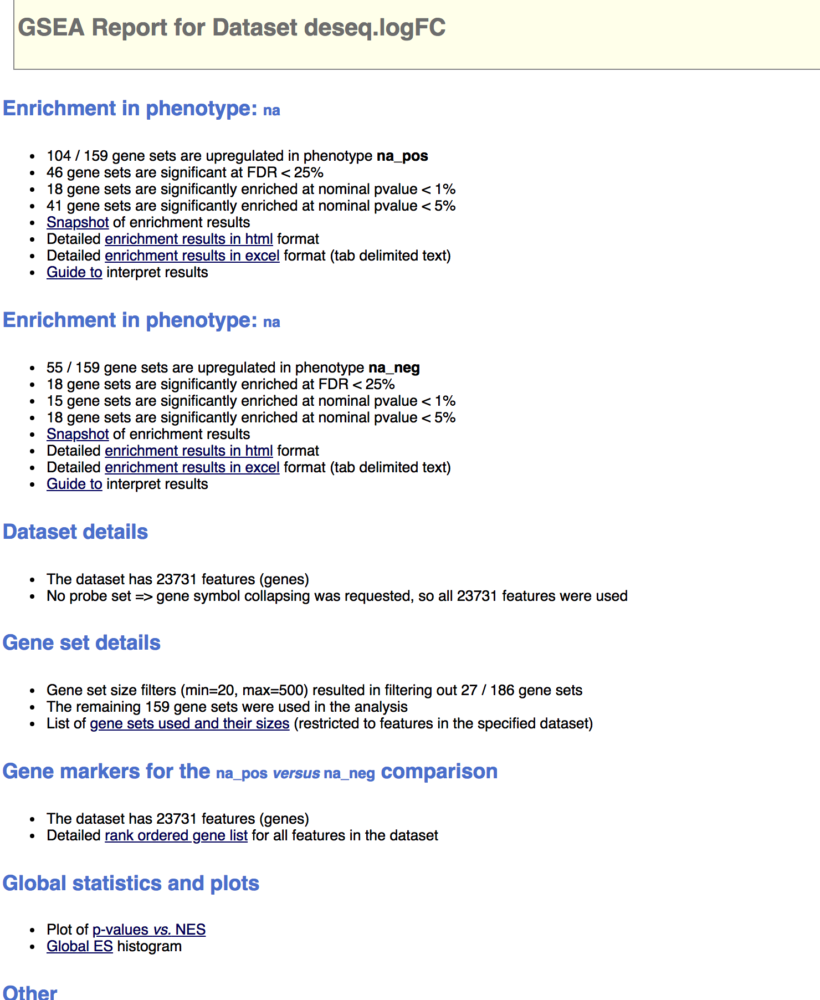

In the bottom part (na_neg), cell cycle pathways are significantly enriched (leading edge 1989).
In the top part (na_pos), the TP53 pathway is enriched (leading edge 780), but apart from that (similarly to the GO analysis), not much can be concluded.

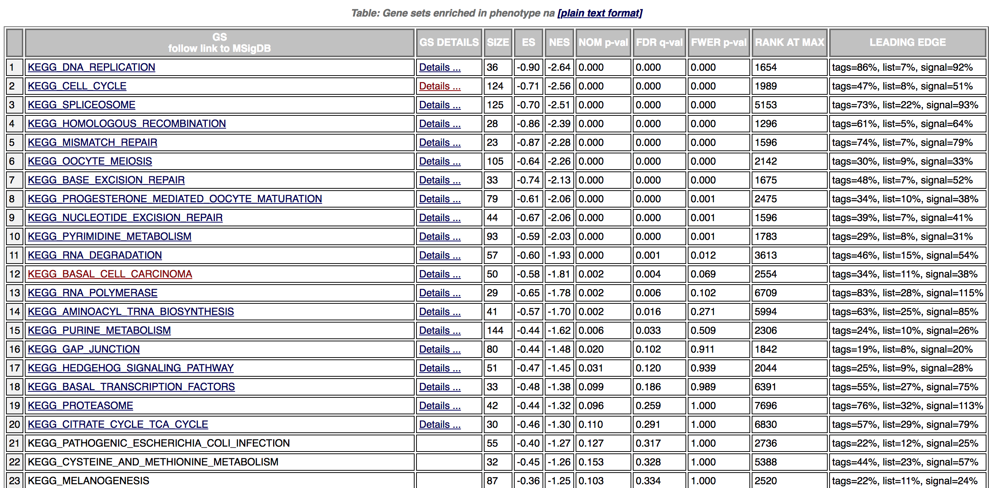

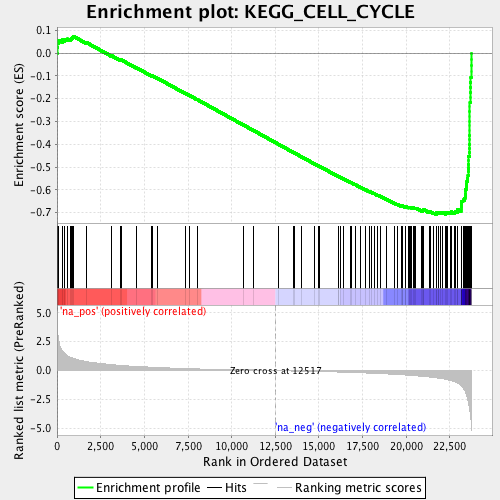

# Motif discovery ; upstream TF identification

Given a set of co-expressed genes, such as all genes significantly up-regulated by p53, can we find enriched transcription factor motifs in the upstream (and intronic, downstream) sequences of this gene set?

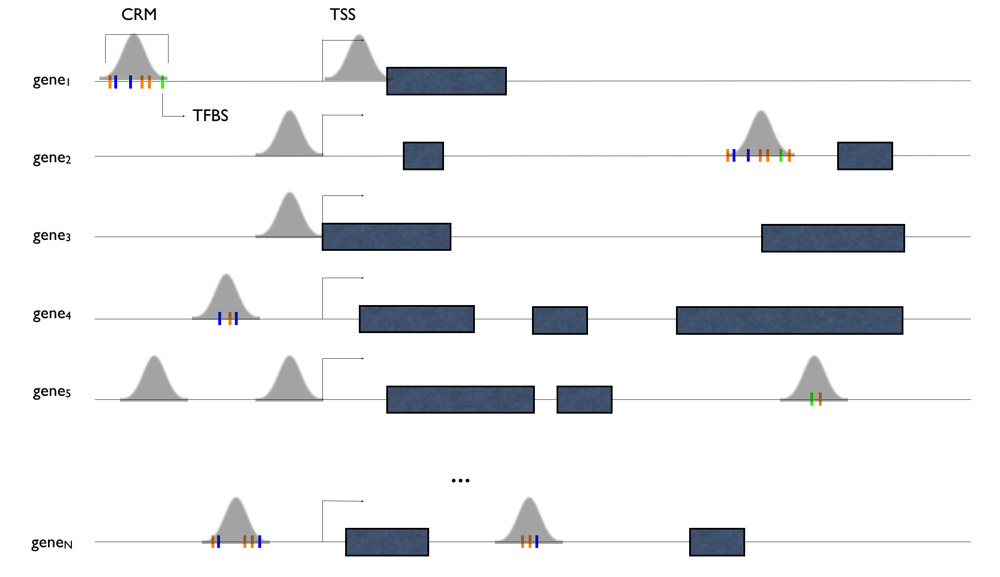

Follow the tutorial of iRegulon: http://iregulon.aertslab.org/tutorial.html

In Cytoscape, do File->Import->Network->File, and choose the text file with all the up-regulated genes.

Choose the gene names as "source node" (there is no target node now). Also turn of the advanced option that the file contains headers in the first row.
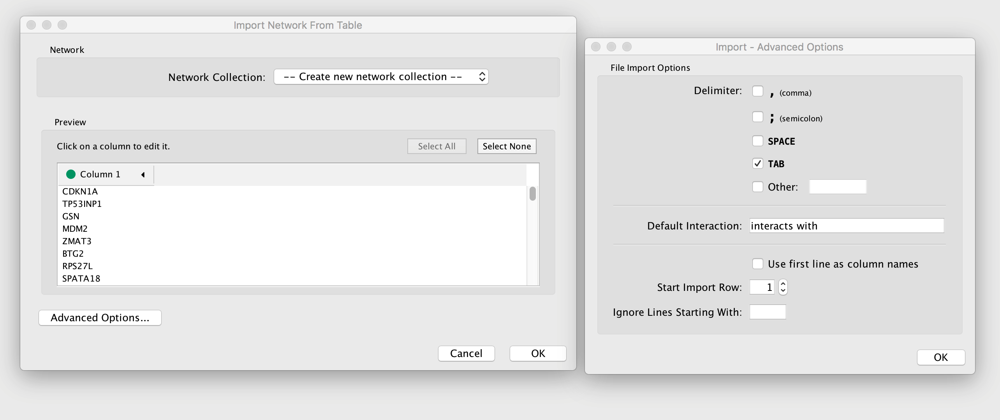

Select all nodes (ctrl-A), then go to Apps, install the iRegulon app, and once installed, run iRegulon with default settings.

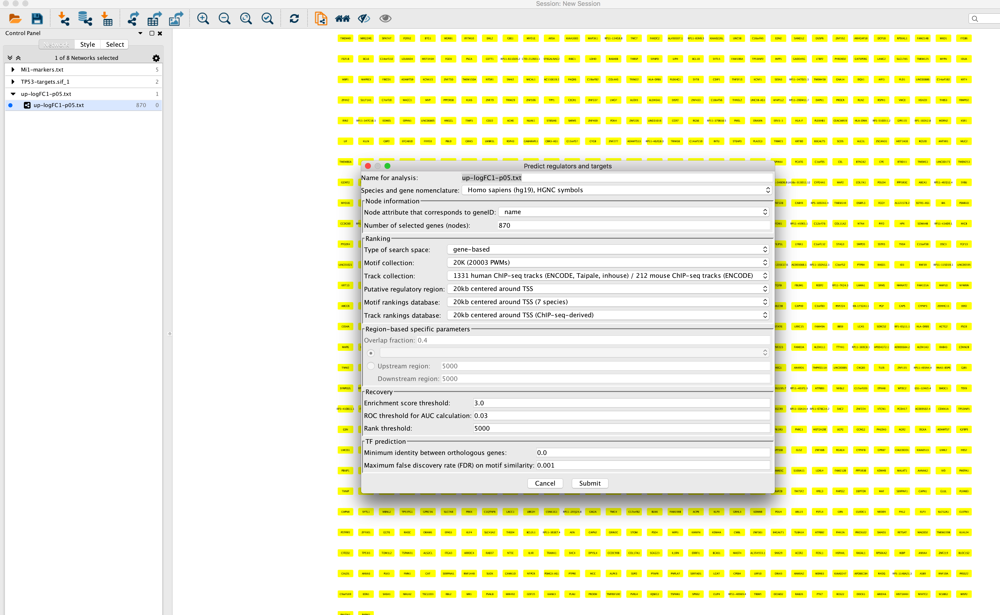

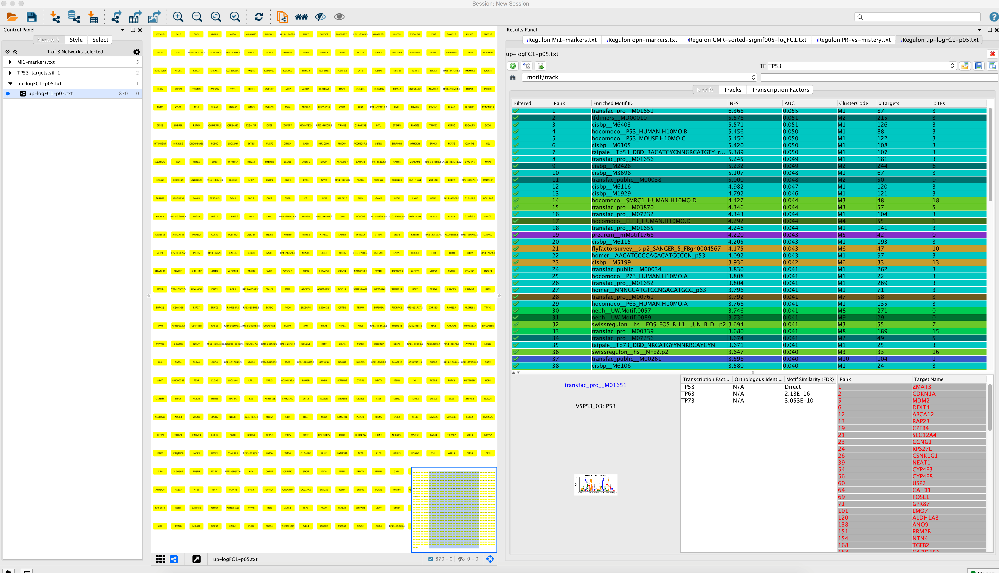

By clicking on the green + button, when a certain motif or TF is active in the right table, the predicted target genes will be connected to the TF by edges. After applying a layout algorithm (Menu-layout), a network of predicted TP53 targets can be obtained:

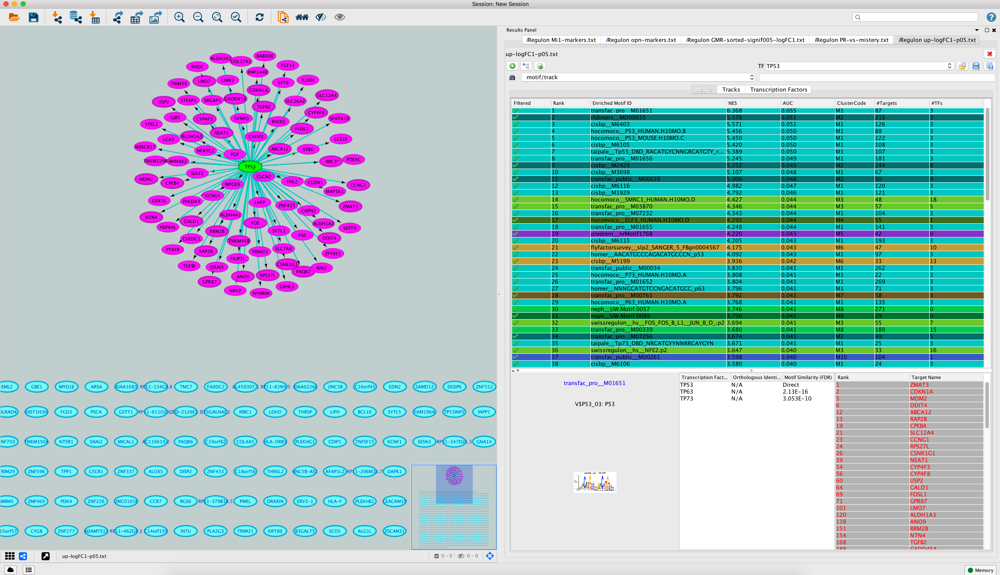